# Symmetry Class Autoencoder Study

This notebook aims to reconstruct patterns from the `symmetry_dataset` folder using a convolutional autoencoder and validate on the `test` folder. The training and evaluation workflow is organized step by step.


In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
# 1. Copy file to local Colab runtime (Daha hızlı I/O için önce kopyala)
!cp "/content/drive/MyDrive/dataset.zip" "/content/dataset.zip"

# 2. Unzip (Quiet mode '-q' çıktıyı gizler, '-d' destination belirtir)
!unzip -q "/content/dataset.zip" -d "/content/"

# 3. Remove the zip file to save space (Disk clean-up)
!rm "/content/dataset.zip"

!mv /content/dataset/* /content/

## Table of Contents
1. Setup and Configuration
2. Dataset Preparation
3. Model Architecture
4. Training with Early Stopping
5. Test Set Validation
6. Reconstruction Visualization
7. Latent Space Analysis (t-SNE & PCA)
8. Error Distribution Analysis
9. Feature Maps Visualization
10. Comprehensive Results Summary


In [3]:
import os
import random
from pathlib import Path
import json
from typing import Optional
from collections import defaultdict

import numpy as np
import torch
from torch import nn
from torch.utils.data import DataLoader, Subset, random_split
from torchvision import datasets, transforms, utils
from PIL import Image
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
import seaborn as sns
from tqdm.auto import tqdm
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA

plt.style.use("ggplot")
sns.set_palette("husl")


def set_seed(seed: int = 42) -> None:
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)


SEED = 42
set_seed(SEED)

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Active device: {DEVICE}")
if torch.cuda.is_available():
    print(f"CUDA device: {torch.cuda.get_device_name(DEVICE)}")


Active device: cuda
CUDA device: Tesla T4


In [4]:
def resolve_base_dir() -> Path:
    candidates = []
    env_base = os.environ.get("SYMMETRY_BASE_DIR")
    if env_base:
        candidates.append(Path(env_base).expanduser())

    notebook_dir = Path.cwd().resolve()
    candidates.extend([
        notebook_dir,
        notebook_dir.parent,
        Path.home() / "Desktop" / "research",
    ])

    for candidate in candidates:
        if candidate is None:
            continue
        candidate = candidate.expanduser().resolve()
        train_dir = candidate / "symmetry_dataset"
        test_dir = candidate / "test"
        if train_dir.exists() and test_dir.exists():
            return candidate

    print(
        "Warning: 'symmetry_dataset' and/or 'test' folders not found. "
        "Please update 'BASE_DIR' value or set 'SYMMETRY_BASE_DIR' environment variable."
    )
    return notebook_dir

BASE_DIR = resolve_base_dir()
IS_WINDOWS = os.name == "nt"

CONFIG = {
    "train_root": BASE_DIR / "symmetry_dataset",
    "test_root": BASE_DIR / "test",
    "output_dir": BASE_DIR / "artifacts",
    "image_size": (256, 256),
    "num_channels": 3,
    "normalize": True,
    "batch_size": 32,
    "num_workers": 0 if IS_WINDOWS else 4,
    "pin_memory": torch.cuda.is_available(),
    "val_split": 0.1,
    "epochs": 30,
    "learning_rate": 1e-3,
    "weight_decay": 1e-5,
    "max_grad_norm": 5.0,
    "patience": 5,
    "max_train_samples": 85000,
    "max_test_samples": None,
    "latent_channels": 64,
    "base_channels": 32,
    "seed": SEED,
}

CONFIG["in_channels"] = CONFIG["num_channels"]
if CONFIG["normalize"]:
    CONFIG["normalize_mean"] = [0.5] * CONFIG["num_channels"]
    CONFIG["normalize_std"] = [0.5] * CONFIG["num_channels"]
else:
    CONFIG["normalize_mean"] = None
    CONFIG["normalize_std"] = None

CONFIG["output_dir"].mkdir(parents=True, exist_ok=True)

print(
    json.dumps(
        {k: (str(v) if isinstance(v, Path) else v) for k, v in CONFIG.items()},
        indent=2,
        ensure_ascii=False,
    )
)


{
  "train_root": "/content/symmetry_dataset",
  "test_root": "/content/test",
  "output_dir": "/content/artifacts",
  "image_size": [
    256,
    256
  ],
  "num_channels": 3,
  "normalize": true,
  "batch_size": 32,
  "num_workers": 4,
  "pin_memory": true,
  "val_split": 0.1,
  "epochs": 30,
  "learning_rate": 0.001,
  "weight_decay": 1e-05,
  "max_grad_norm": 5.0,
  "patience": 5,
  "max_train_samples": 85000,
  "max_test_samples": null,
  "latent_channels": 64,
  "base_channels": 32,
  "seed": 42,
  "in_channels": 3,
  "normalize_mean": [
    0.5,
    0.5,
    0.5
  ],
  "normalize_std": [
    0.5,
    0.5,
    0.5
  ]
}


In [5]:
def build_transforms(config: dict) -> transforms.Compose:
    items = []
    num_channels = config.get("num_channels", 3)
    if num_channels == 3:
        items.append(transforms.Lambda(lambda img: img.convert("RGB")))
    elif num_channels == 1:
        items.append(transforms.Lambda(lambda img: img.convert("L")))
    else:
        raise ValueError(f"Unsupported number of channels: {num_channels}")
    items.append(transforms.Resize(config["image_size"], antialias=True))
    items.append(transforms.ToTensor())
    if config["normalize"]:
        items.append(transforms.Normalize(mean=config["normalize_mean"], std=config["normalize_std"]))
    return transforms.Compose(items)


def create_dataloaders(config: dict):
    transform = build_transforms(config)

    train_full = datasets.ImageFolder(config["train_root"], transform=transform)
    test_full = datasets.ImageFolder(config["test_root"], transform=transform)
    class_names = train_full.classes

    if config["max_train_samples"] is not None:
        sample_size = min(config["max_train_samples"], len(train_full))
        indices = random.sample(range(len(train_full)), k=sample_size)
        train_full = Subset(train_full, indices)

    if config["max_test_samples"] is not None:
        sample_size = min(config["max_test_samples"], len(test_full))
        indices = random.sample(range(len(test_full)), k=sample_size)
        test_full = Subset(test_full, indices)

    val_size = int(len(train_full) * config["val_split"])
    if val_size == 0 and len(train_full) > 1:
        val_size = 1
    train_size = len(train_full) - val_size
    if train_size <= 0:
        raise ValueError("No training data remaining; please review `max_train_samples` or `val_split` values.")

    train_subset, val_subset = random_split(
        train_full,
        [train_size, val_size],
        generator=torch.Generator().manual_seed(config["seed"]),
    )

    loader_kwargs = {
        "batch_size": config["batch_size"],
        "num_workers": config["num_workers"],
        "pin_memory": config["pin_memory"],
    }

    train_loader = DataLoader(train_subset, shuffle=True, **loader_kwargs)
    val_loader = DataLoader(val_subset, shuffle=False, **loader_kwargs) if val_size > 0 else None
    test_loader = DataLoader(test_full, shuffle=False, **loader_kwargs)

    metadata = {
        "class_names": class_names,
        "train_size": len(train_subset),
        "val_size": len(val_subset) if val_loader is not None else 0,
        "test_size": len(test_full),
    }

    return train_loader, val_loader, test_loader, metadata, transform


def denormalize(tensor: torch.Tensor, mean, std) -> torch.Tensor:
    if mean is None or std is None:
        return tensor.clamp(0.0, 1.0)
    mean = torch.tensor(mean, device=tensor.device).view(1, -1, 1, 1)
    std = torch.tensor(std, device=tensor.device).view(1, -1, 1, 1)
    return tensor * std + mean


def show_batch(loader: DataLoader, config: dict, title: str = "Training Data Sample", max_images: int = 16):
    images, labels = next(iter(loader))
    images = images[:max_images]
    labels = labels[:max_images]

    images = denormalize(images, config["normalize_mean"], config["normalize_std"]).cpu()
    grid = utils.make_grid(images, nrow=int(max_images ** 0.5), pad_value=1.0)
    grid_np = grid.permute(1, 2, 0).numpy()

    if grid_np.shape[2] == 1:
        grid_np = grid_np.squeeze(-1)
        cmap = "gray"
    else:
        cmap = None

    plt.figure(figsize=(8, 8))
    plt.imshow(grid_np, cmap=cmap)
    plt.axis("off")
    plt.title(title)
    plt.show()



Training samples: 76500
Validation samples: 8500
Test samples: 355
Number of classes: 17
Class names: ['cm', 'cmm', 'p1', 'p2', 'p3', 'p31m', 'p3m1', 'p4', 'p4g', 'p4m', 'p6', 'p6m', 'pg', 'pgg', 'pm', 'pmg', 'pmm']


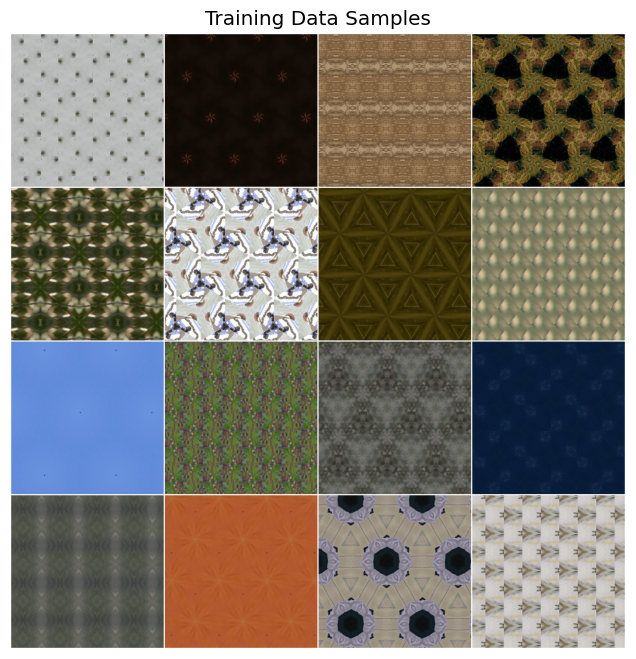

In [6]:
train_loader, val_loader, test_loader, metadata, _ = create_dataloaders(CONFIG)

print(f"Training samples: {metadata['train_size']}")
print(f"Validation samples: {metadata['val_size']}")
print(f"Test samples: {metadata['test_size']}")
print(f"Number of classes: {len(metadata['class_names'])}")
print(f"Class names: {metadata['class_names']}")

show_batch(train_loader, CONFIG, title="Training Data Samples")


In [7]:
class ConvAutoencoder(nn.Module):
    def __init__(
        self,
        in_channels: int,
        base_channels: int = 32,
        latent_channels: int = 64,
        output_activation: str = "tanh",
    ) -> None:
        super().__init__()

        if output_activation == "tanh":
            activation = nn.Tanh()
        elif output_activation == "sigmoid":
            activation = nn.Sigmoid()
        elif output_activation == "identity":
            activation = nn.Identity()
        else:
            raise ValueError(f"Unsupported output activation: {output_activation}")

        self.encoder = nn.Sequential(
            nn.Conv2d(in_channels, base_channels, kernel_size=3, stride=2, padding=1),
            nn.BatchNorm2d(base_channels),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(base_channels, base_channels * 2, kernel_size=3, stride=2, padding=1),
            nn.BatchNorm2d(base_channels * 2),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(base_channels * 2, base_channels * 4, kernel_size=3, stride=2, padding=1),
            nn.BatchNorm2d(base_channels * 4),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(base_channels * 4, latent_channels, kernel_size=3, stride=2, padding=1),
            nn.BatchNorm2d(latent_channels),
            nn.LeakyReLU(0.2, inplace=True),
        )

        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(latent_channels, base_channels * 4, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(base_channels * 4),
            nn.ReLU(inplace=True),

            nn.ConvTranspose2d(base_channels * 4, base_channels * 2, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(base_channels * 2),
            nn.ReLU(inplace=True),

            nn.ConvTranspose2d(base_channels * 2, base_channels, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(base_channels),
            nn.ReLU(inplace=True),

            nn.ConvTranspose2d(base_channels, in_channels, kernel_size=4, stride=2, padding=1),
            activation,
        )

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        latent = self.encoder(x)
        reconstruction = self.decoder(latent)
        return reconstruction


def count_parameters(model: nn.Module) -> int:
    return sum(param.numel() for param in model.parameters() if param.requires_grad)


In [8]:
output_activation = "tanh" if CONFIG["normalize"] else "sigmoid"
model = ConvAutoencoder(
    in_channels=CONFIG["in_channels"],
    base_channels=CONFIG["base_channels"],
    latent_channels=CONFIG["latent_channels"],
    output_activation=output_activation,
).to(DEVICE)

param_count = count_parameters(model)
print(f"Model parameter count: {param_count:,}")
print(f"Model size: {param_count / 1e6:.2f} M parameters")
print(f"\nModel Architecture:")
print(model)


Model parameter count: 464,739
Model size: 0.46 M parameters

Model Architecture:
ConvAutoencoder(
  (encoder): Sequential(
    (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2, inplace=True)
    (3): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): LeakyReLU(negative_slope=0.2, inplace=True)
    (6): Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): LeakyReLU(negative_slope=0.2, inplace=True)
    (9): Conv2d(128, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): LeakyReLU(negative_slope=0.2, inplace=True)
  )


In [9]:
def evaluate_loss(model: nn.Module, loader: DataLoader, criterion) -> float:
    model.eval()
    total_loss = 0.0
    sample_count = 0
    with torch.no_grad():
        for images, _ in loader:
            images = images.to(DEVICE, non_blocking=True)
            outputs = model(images)
            loss = criterion(outputs, images)
            batch_size = images.size(0)
            total_loss += loss.item() * batch_size
            sample_count += batch_size
    return total_loss / max(1, sample_count)



def train_autoencoder(model: nn.Module, train_loader: DataLoader, val_loader: Optional[DataLoader], config: dict):
    criterion = nn.MSELoss()
    optimizer = torch.optim.AdamW(
        model.parameters(),
        lr=config["learning_rate"],
        weight_decay=config["weight_decay"],
    )
    scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=config["epochs"])

    history = {"train": [], "val": [], "lr": []}
    best_val_loss = float("inf")
    best_state = None
    patience_counter = 0

    for epoch in range(1, config["epochs"] + 1):
        model.train()
        running_loss = 0.0
        sample_count = 0

        progress = tqdm(train_loader, desc=f"Epoch {epoch}/{config['epochs']} - training", leave=False)
        for images, _ in progress:
            images = images.to(DEVICE, non_blocking=True)

            optimizer.zero_grad(set_to_none=True)
            outputs = model(images)
            loss = criterion(outputs, images)
            loss.backward()

            nn.utils.clip_grad_norm_(model.parameters(), max_norm=config["max_grad_norm"])
            optimizer.step()

            batch_size = images.size(0)
            running_loss += loss.item() * batch_size
            sample_count += batch_size
            progress.set_postfix(loss=loss.item())

        train_loss = running_loss / max(1, sample_count)
        history["train"].append(train_loss)
        history["lr"].append(optimizer.param_groups[0]["lr"])

        val_loss = None
        if val_loader is not None:
            val_loss = evaluate_loss(model, val_loader, criterion)
            history["val"].append(val_loss)

            if val_loss < best_val_loss - 1e-5:
                best_val_loss = val_loss
                patience_counter = 0
                best_state = {
                    "model": model.state_dict(),
                    "optimizer": optimizer.state_dict(),
                    "epoch": epoch,
                    "val_loss": best_val_loss,
                }
                checkpoint_path = CONFIG["output_dir"] / "best_autoencoder.pt"
                torch.save(best_state, checkpoint_path)
            else:
                patience_counter += 1
        else:
            history["val"].append(None)
            patience_counter = 0  # no validation = no early stopping

        scheduler.step()

        print(f"Epoch {epoch}: train_loss={train_loss:.6f}" + (f", val_loss={val_loss:.6f}" if val_loss is not None else ""))

        if val_loader is not None and patience_counter >= config["patience"]:
            print("Early stopping triggered.")
            break

    if best_state is None:
        best_state = {"model": model.state_dict()}
    return history, best_state


## Running the Training Loop

The following cell starts the full training loop. Training time depends on the selected number of samples and your hardware. If you need to stop training, you can manually terminate the execution.


In [11]:
%%time
history, best_state = train_autoencoder(model, train_loader, val_loader, CONFIG)


Epoch 1/30 - training:   0%|          | 0/2391 [00:00<?, ?it/s]

Epoch 1: train_loss=0.012030, val_loss=0.011887


Epoch 2/30 - training:   0%|          | 0/2391 [00:00<?, ?it/s]

Epoch 2: train_loss=0.011912, val_loss=0.012202


Epoch 3/30 - training:   0%|          | 0/2391 [00:00<?, ?it/s]

Epoch 3: train_loss=0.011710, val_loss=0.010148


Epoch 4/30 - training:   0%|          | 0/2391 [00:00<?, ?it/s]

Epoch 4: train_loss=0.011644, val_loss=0.010093


Epoch 5/30 - training:   0%|          | 0/2391 [00:00<?, ?it/s]

Epoch 5: train_loss=0.011456, val_loss=0.010470


Epoch 6/30 - training:   0%|          | 0/2391 [00:00<?, ?it/s]

Epoch 6: train_loss=0.011403, val_loss=0.009829


Epoch 7/30 - training:   0%|          | 0/2391 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7a97957edee0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^Exception ignored in: ^<function _MultiProcessingDataLoaderIter.__del__ at 0x7a97957edee0>
^Traceback (most recent call last):
^^  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
^    ^self._shutdown_workers()^
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
    ^if w.is_alive():^
^ ^   ^ ^ ^ ^^^^^

Epoch 7: train_loss=0.011214, val_loss=0.010048


Epoch 8/30 - training:   0%|          | 0/2391 [00:00<?, ?it/s]

Epoch 8: train_loss=0.011156, val_loss=0.010218


Epoch 9/30 - training:   0%|          | 0/2391 [00:00<?, ?it/s]

Epoch 9: train_loss=0.010980, val_loss=0.011578


Epoch 10/30 - training:   0%|          | 0/2391 [00:00<?, ?it/s]

Epoch 10: train_loss=0.010920, val_loss=0.011274


Epoch 11/30 - training:   0%|          | 0/2391 [00:00<?, ?it/s]

Epoch 11: train_loss=0.010742, val_loss=0.009663


Epoch 12/30 - training:   0%|          | 0/2391 [00:00<?, ?it/s]

Epoch 12: train_loss=0.010614, val_loss=0.009624


Epoch 13/30 - training:   0%|          | 0/2391 [00:00<?, ?it/s]

Epoch 13: train_loss=0.010549, val_loss=0.009668


Epoch 14/30 - training:   0%|          | 0/2391 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7a97957edee0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
AssertionError: can only test a child process
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7a97957edee0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

Epoch 14: train_loss=0.010422, val_loss=0.009650


Epoch 15/30 - training:   0%|          | 0/2391 [00:00<?, ?it/s]

Epoch 15: train_loss=0.010336, val_loss=0.009334


Epoch 16/30 - training:   0%|          | 0/2391 [00:00<?, ?it/s]

Epoch 16: train_loss=0.010291, val_loss=0.009285


Epoch 17/30 - training:   0%|          | 0/2391 [00:00<?, ?it/s]

Epoch 17: train_loss=0.010181, val_loss=0.009558


Epoch 18/30 - training:   0%|          | 0/2391 [00:00<?, ?it/s]

Epoch 18: train_loss=0.010114, val_loss=0.009304


Epoch 19/30 - training:   0%|          | 0/2391 [00:00<?, ?it/s]

Epoch 19: train_loss=0.010048, val_loss=0.009307


Epoch 20/30 - training:   0%|          | 0/2391 [00:00<?, ?it/s]

Epoch 20: train_loss=0.010012, val_loss=0.009427


Epoch 21/30 - training:   0%|          | 0/2391 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7a97957edee0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__
    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1637, in _shutdown_workers
    if w.is_alive():
       ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^Exception ignored in: ^<function _MultiProcessingDataLoaderIter.__del__ at 0x7a97957edee0>
AssertionError
: Traceback (most recent call last):
can only test a child process  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1654, in __del__

    self._shutdown_workers()
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 16

Epoch 21: train_loss=0.009903, val_loss=0.009579
Early stopping triggered.
CPU times: user 1h 6min 40s, sys: 5min 41s, total: 1h 12min 21s
Wall time: 1h 7min 50s


In [12]:
checkpoint_path = CONFIG["output_dir"] / "best_autoencoder.pt"
if checkpoint_path.exists():
    checkpoint = torch.load(checkpoint_path, map_location=DEVICE, weights_only=True)
    model.load_state_dict(checkpoint["model"])
    print(f"Best model loaded (epoch={checkpoint.get('epoch')}, val_loss={checkpoint.get('val_loss'):.6f})")
else:
    print("Warning: Checkpoint not found, using current weights.")


Best model loaded (epoch=16, val_loss=0.009285)


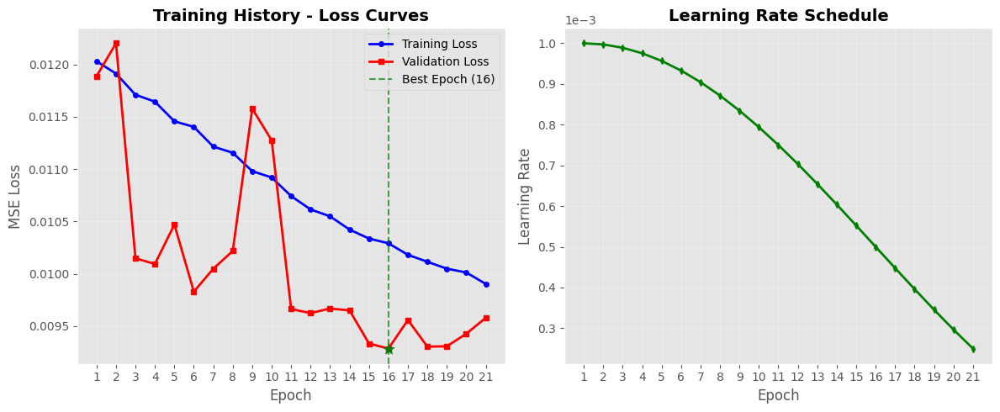


TRAINING SUMMARY
Total Epochs: 21
Final Training Loss: 0.009903
Final Validation Loss: 0.009579
Best Validation Loss: 0.009285


In [13]:
def plot_training_history(history: dict) -> None:
    """Plot comprehensive training history with multiple subplots."""
    epochs = range(1, len(history["train"]) + 1)

    has_val = any(v is not None for v in history.get("val", []))
    has_lr = len(history.get("lr", [])) > 0

    n_plots = 1 + (1 if has_lr else 0)
    fig, axes = plt.subplots(1, n_plots, figsize=(6 * n_plots, 5))
    if n_plots == 1:
        axes = [axes]

    # Plot 1: Loss curves
    ax1 = axes[0]
    ax1.plot(epochs, history["train"], 'b-', linewidth=2, label="Training Loss", marker='o', markersize=4)
    if has_val:
        val_losses = [v if v is not None else float("nan") for v in history["val"]]
        ax1.plot(epochs, val_losses, 'r-', linewidth=2, label="Validation Loss", marker='s', markersize=4)

        # Find best epoch
        valid_vals = [(i, v) for i, v in enumerate(val_losses) if not np.isnan(v)]
        if valid_vals:
            best_idx, best_val = min(valid_vals, key=lambda x: x[1])
            ax1.axvline(x=best_idx + 1, color='g', linestyle='--', alpha=0.7, label=f'Best Epoch ({best_idx + 1})')
            ax1.scatter([best_idx + 1], [best_val], color='g', s=100, zorder=5, marker='*')

    ax1.set_xlabel("Epoch", fontsize=12)
    ax1.set_ylabel("MSE Loss", fontsize=12)
    ax1.set_title("Training History - Loss Curves", fontsize=14, fontweight='bold')
    ax1.legend(loc='upper right')
    ax1.grid(True, alpha=0.3)
    ax1.set_xticks(epochs)

    # Plot 2: Learning rate schedule
    if has_lr:
        ax2 = axes[1]
        ax2.plot(epochs, history["lr"], 'g-', linewidth=2, marker='d', markersize=4)
        ax2.set_xlabel("Epoch", fontsize=12)
        ax2.set_ylabel("Learning Rate", fontsize=12)
        ax2.set_title("Learning Rate Schedule", fontsize=14, fontweight='bold')
        ax2.grid(True, alpha=0.3)
        ax2.set_xticks(epochs)
        ax2.ticklabel_format(style='scientific', axis='y', scilimits=(0,0))

    plt.tight_layout()
    plt.savefig(CONFIG["output_dir"] / "training_history.png", dpi=150, bbox_inches='tight')
    plt.show()

    # Print summary statistics
    print("\n" + "="*60)
    print("TRAINING SUMMARY")
    print("="*60)
    print(f"Total Epochs: {len(epochs)}")
    print(f"Final Training Loss: {history['train'][-1]:.6f}")
    if has_val:
        final_val = history['val'][-1] if history['val'][-1] is not None else float('nan')
        best_val_loss = min([v for v in history['val'] if v is not None])
        print(f"Final Validation Loss: {final_val:.6f}")
        print(f"Best Validation Loss: {best_val_loss:.6f}")
    print("="*60)


plot_training_history(history)


In [14]:
def reconstruction_errors_by_class(model: nn.Module, loader: DataLoader) -> dict:
    """Calculate reconstruction errors for each class."""
    model.eval()
    criterion = nn.MSELoss(reduction="none")
    class_errors = defaultdict(list)

    with torch.no_grad():
        for images, labels in loader:
            images = images.to(DEVICE, non_blocking=True)
            outputs = model(images)
            loss_map = criterion(outputs, images)
            per_sample = loss_map.view(loss_map.size(0), -1).mean(dim=1)

            for idx, label in enumerate(labels.tolist()):
                class_errors[label].append(per_sample[idx].item())

    return class_errors


def summarize_class_errors(class_errors: dict, class_names: list[str]) -> list[tuple[str, float, float]]:
    """Summarize reconstruction errors by class with mean and std."""
    summary = []
    for class_idx, errors in class_errors.items():
        errors_array = np.array(errors)
        summary.append(
            (
                class_names[class_idx],
                float(errors_array.mean()),
                float(errors_array.std()),
            )
        )
    summary.sort(key=lambda x: x[1])
    return summary


In [15]:
test_loss = evaluate_loss(model, test_loader, nn.MSELoss())
print(f"Test MSE Loss: {test_loss:.6f}")

class_errors = reconstruction_errors_by_class(model, test_loader)
class_summary = summarize_class_errors(class_errors, metadata["class_names"])

print("\n" + "="*60)
print("CLASS-WISE RECONSTRUCTION ERROR (mean ± std)")
print("="*60)
for name, mean_err, std_err in class_summary:
    print(f"  {name:20s}: {mean_err:.6f} ± {std_err:.6f}")
print("="*60)


Test MSE Loss: 0.060758

CLASS-WISE RECONSTRUCTION ERROR (mean ± std)
  p1                  : 0.030025 ± 0.027309
  pm                  : 0.036713 ± 0.030132
  cm                  : 0.043554 ± 0.033758
  p3m1                : 0.046524 ± 0.038429
  pmg                 : 0.049887 ± 0.038073
  p3                  : 0.052804 ± 0.043831
  p31m                : 0.053864 ± 0.036063
  p2                  : 0.058557 ± 0.058189
  p4m                 : 0.058996 ± 0.035134
  pg                  : 0.061262 ± 0.060334
  cmm                 : 0.062279 ± 0.075607
  p4g                 : 0.064847 ± 0.051951
  pmm                 : 0.068911 ± 0.051598
  pgg                 : 0.074798 ± 0.081493
  p6m                 : 0.087812 ± 0.075404
  p4                  : 0.107977 ± 0.126374
  p6                  : 0.110968 ± 0.096030


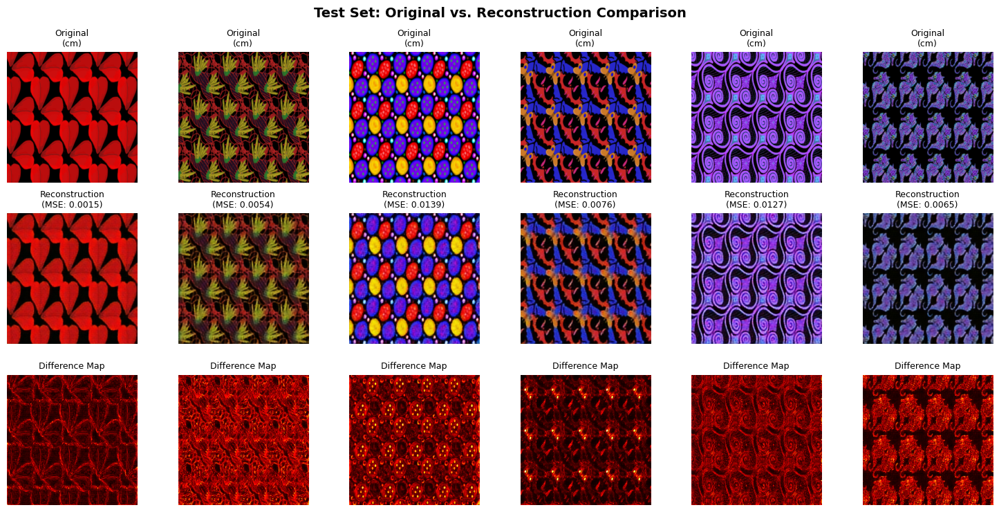

In [16]:
def visualize_reconstructions(model: nn.Module, loader: DataLoader, config: dict,
                               class_names: list, num_images: int = 8, title_prefix: str = "") -> None:
    """Visualize original images, reconstructions, and difference maps."""
    model.eval()
    images, labels = next(iter(loader))
    images = images[:num_images].to(DEVICE, non_blocking=True)

    with torch.no_grad():
        reconstructions = model(images)

    images_denorm = denormalize(images, config["normalize_mean"], config["normalize_std"]).cpu()
    recon_denorm = denormalize(reconstructions, config["normalize_mean"], config["normalize_std"]).cpu()

    # Calculate per-pixel difference
    diff = torch.abs(images_denorm - recon_denorm)

    rows = 3
    cols = num_images
    fig, axes = plt.subplots(rows, cols, figsize=(2.5 * cols, 2.5 * rows))

    for idx in range(num_images):
        original = images_denorm[idx].permute(1, 2, 0).numpy().clip(0, 1)
        recon = recon_denorm[idx].permute(1, 2, 0).numpy().clip(0, 1)
        difference = diff[idx].permute(1, 2, 0).numpy()

        # Calculate MSE for this image
        mse = np.mean(difference ** 2)

        label_idx = labels[idx].item()
        class_name = class_names[label_idx] if label_idx < len(class_names) else f"Class {label_idx}"

        if original.shape[2] == 1:
            original = original.squeeze(-1)
            recon = recon.squeeze(-1)
            difference = difference.squeeze(-1)
            cmap = "gray"
            diff_cmap = "hot"
        else:
            cmap = None
            diff_cmap = "hot"
            difference = np.mean(difference, axis=2)  # Average across channels for visualization

        axes[0, idx].imshow(original, cmap=cmap)
        axes[0, idx].axis("off")
        axes[0, idx].set_title(f"Original\n({class_name})", fontsize=9)

        axes[1, idx].imshow(recon, cmap=cmap)
        axes[1, idx].axis("off")
        axes[1, idx].set_title(f"Reconstruction\n(MSE: {mse:.4f})", fontsize=9)

        im = axes[2, idx].imshow(difference, cmap=diff_cmap, vmin=0, vmax=difference.max())
        axes[2, idx].axis("off")
        axes[2, idx].set_title("Difference Map", fontsize=9)

    # Add row labels
    axes[0, 0].set_ylabel("Original", fontsize=11, fontweight='bold')
    axes[1, 0].set_ylabel("Reconstructed", fontsize=11, fontweight='bold')
    axes[2, 0].set_ylabel("Difference", fontsize=11, fontweight='bold')

    fig.suptitle(f"{title_prefix}Original vs. Reconstruction Comparison", fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.savefig(CONFIG["output_dir"] / "reconstruction_comparison.png", dpi=150, bbox_inches='tight')
    plt.show()


visualize_reconstructions(model, test_loader, CONFIG, metadata["class_names"], num_images=6, title_prefix="Test Set: ")


## Latent Space Analysis (t-SNE & PCA)


In [17]:
def extract_latent_features(model: nn.Module, loader: DataLoader, max_samples: int = 2000):
    """Extract latent space representations from the encoder."""
    model.eval()
    latent_vectors = []
    labels_list = []

    with torch.no_grad():
        for images, labels in tqdm(loader, desc="Extracting latent features"):
            images = images.to(DEVICE, non_blocking=True)
            latent = model.encoder(images)
            # Flatten the latent representation
            latent_flat = latent.view(latent.size(0), -1).cpu().numpy()
            latent_vectors.append(latent_flat)
            labels_list.append(labels.numpy())

            if sum(len(l) for l in labels_list) >= max_samples:
                break

    latent_vectors = np.vstack(latent_vectors)[:max_samples]
    labels_array = np.concatenate(labels_list)[:max_samples]

    return latent_vectors, labels_array


def plot_tsne_visualization(latent_vectors: np.ndarray, labels: np.ndarray,
                            class_names: list, perplexity: int = 30) -> None:
    """Visualize latent space using t-SNE dimensionality reduction."""
    print(f"Running t-SNE on {len(latent_vectors)} samples...")

    tsne = TSNE(n_components=2, perplexity=perplexity, random_state=SEED,
                n_iter=1000, learning_rate='auto', init='pca')
    latent_2d = tsne.fit_transform(latent_vectors)

    plt.figure(figsize=(14, 10))

    unique_labels = np.unique(labels)
    colors = plt.cm.tab20(np.linspace(0, 1, len(unique_labels)))

    for idx, label in enumerate(unique_labels):
        mask = labels == label
        class_name = class_names[label] if label < len(class_names) else f"Class {label}"
        plt.scatter(latent_2d[mask, 0], latent_2d[mask, 1],
                   c=[colors[idx]], label=class_name, alpha=0.7, s=50, edgecolors='white', linewidth=0.5)

    plt.xlabel("t-SNE Component 1", fontsize=12)
    plt.ylabel("t-SNE Component 2", fontsize=12)
    plt.title("t-SNE Visualization of Latent Space", fontsize=14, fontweight='bold')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=9)
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.savefig(CONFIG["output_dir"] / "tsne_latent_space.png", dpi=150, bbox_inches='tight')
    plt.show()

    return latent_2d


def plot_pca_visualization(latent_vectors: np.ndarray, labels: np.ndarray,
                           class_names: list, n_components: int = 2) -> None:
    """Visualize latent space using PCA dimensionality reduction."""
    print(f"Running PCA on {len(latent_vectors)} samples...")

    pca = PCA(n_components=n_components, random_state=SEED)
    latent_pca = pca.fit_transform(latent_vectors)

    explained_var = pca.explained_variance_ratio_

    fig, axes = plt.subplots(1, 2, figsize=(16, 6))

    # Plot 1: 2D PCA scatter
    ax1 = axes[0]
    unique_labels = np.unique(labels)
    colors = plt.cm.tab20(np.linspace(0, 1, len(unique_labels)))

    for idx, label in enumerate(unique_labels):
        mask = labels == label
        class_name = class_names[label] if label < len(class_names) else f"Class {label}"
        ax1.scatter(latent_pca[mask, 0], latent_pca[mask, 1],
                   c=[colors[idx]], label=class_name, alpha=0.7, s=50, edgecolors='white', linewidth=0.5)

    ax1.set_xlabel(f"PC1 ({explained_var[0]*100:.1f}% variance)", fontsize=12)
    ax1.set_ylabel(f"PC2 ({explained_var[1]*100:.1f}% variance)", fontsize=12)
    ax1.set_title("PCA Visualization of Latent Space", fontsize=14, fontweight='bold')
    ax1.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=8)
    ax1.grid(True, alpha=0.3)

    # Plot 2: Explained variance ratio
    ax2 = axes[1]
    pca_full = PCA(random_state=SEED)
    pca_full.fit(latent_vectors)
    cumsum = np.cumsum(pca_full.explained_variance_ratio_)

    ax2.bar(range(1, min(21, len(cumsum)+1)), pca_full.explained_variance_ratio_[:20],
            alpha=0.7, label='Individual', color='steelblue')
    ax2.plot(range(1, min(21, len(cumsum)+1)), cumsum[:20], 'ro-', label='Cumulative')
    ax2.axhline(y=0.95, color='g', linestyle='--', label='95% threshold')
    ax2.set_xlabel("Principal Component", fontsize=12)
    ax2.set_ylabel("Explained Variance Ratio", fontsize=12)
    ax2.set_title("PCA Explained Variance", fontsize=14, fontweight='bold')
    ax2.legend()
    ax2.grid(True, alpha=0.3)

    plt.tight_layout()
    plt.savefig(CONFIG["output_dir"] / "pca_latent_space.png", dpi=150, bbox_inches='tight')
    plt.show()

    # Print variance info
    n_95 = np.argmax(cumsum >= 0.95) + 1
    print(f"\nPCA Analysis:")
    print(f"  - First 2 components explain {cumsum[1]*100:.1f}% of variance")
    print(f"  - {n_95} components needed to explain 95% of variance")

    return latent_pca, pca


Extracting latent features from test set...


Extracting latent features:   0%|          | 0/12 [00:00<?, ?it/s]

Latent space shape: (355, 16384)
Number of samples: 355
Unique classes: 17
Running t-SNE on 355 samples...


/usr/local/lib/python3.12/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


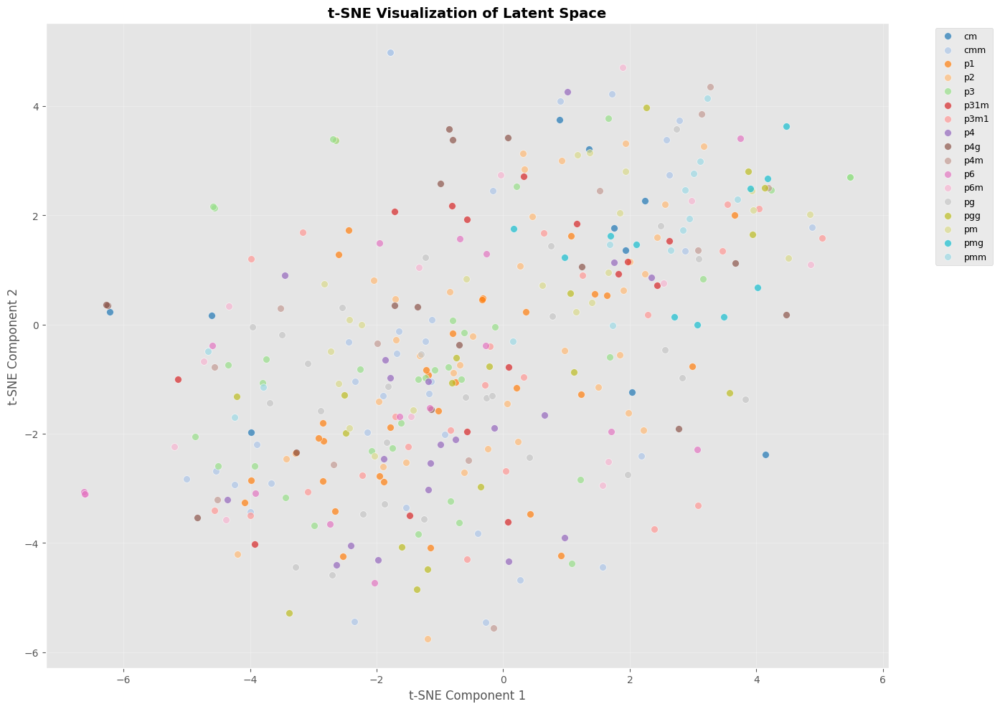

Running PCA on 355 samples...


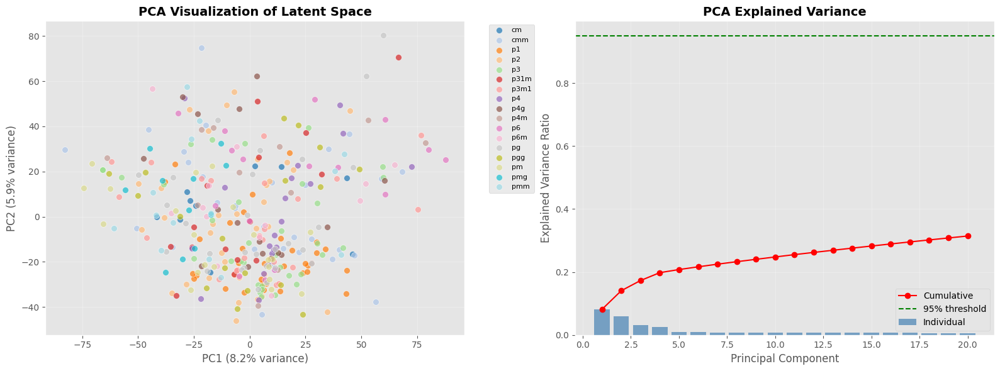


PCA Analysis:
  - First 2 components explain 14.1% of variance
  - 272 components needed to explain 95% of variance


In [18]:
# Extract latent features from test set
print("Extracting latent features from test set...")
latent_test, labels_test = extract_latent_features(model, test_loader, max_samples=1000)

print(f"Latent space shape: {latent_test.shape}")
print(f"Number of samples: {len(labels_test)}")
print(f"Unique classes: {len(np.unique(labels_test))}")

# Run t-SNE visualization
tsne_result = plot_tsne_visualization(latent_test, labels_test, metadata["class_names"], perplexity=30)

# Run PCA visualization
pca_result, pca_model = plot_pca_visualization(latent_test, labels_test, metadata["class_names"])


In [19]:
## Error Distribution Analysis


/tmp/ipython-input-3331144704.py:29: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = ax2.boxplot(class_data, patch_artist=True, labels=class_labels_sorted)


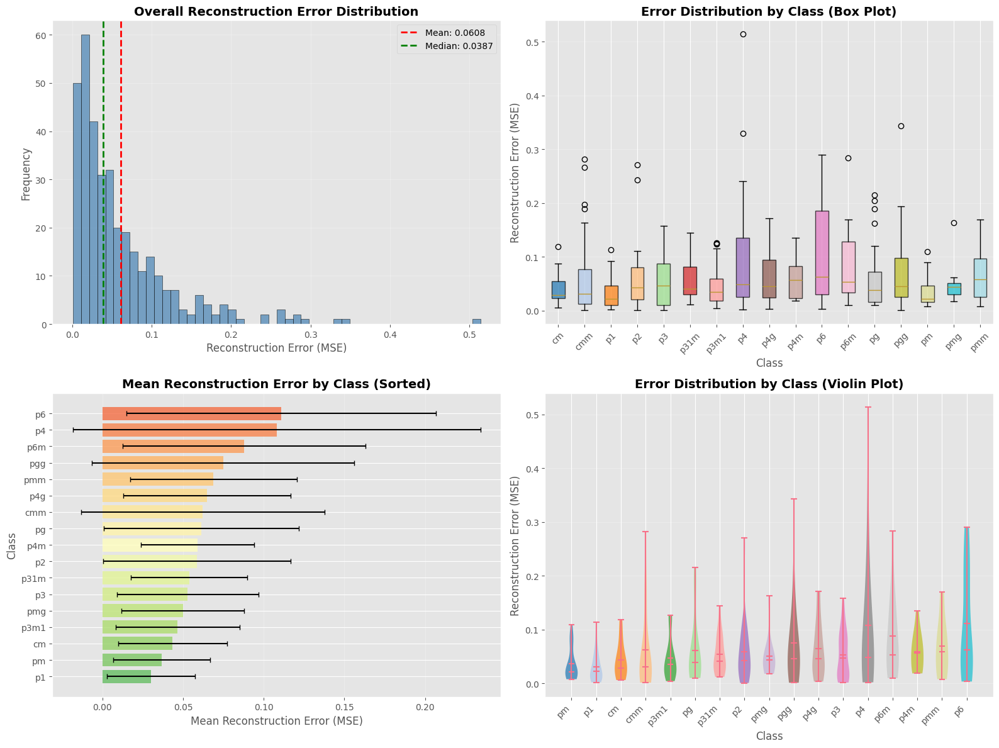


ERROR DISTRIBUTION STATISTICS
Total samples: 355
Mean error: 0.060758
Std error: 0.065446
Min error: 0.000499
Max error: 0.513804
Median error: 0.038702


In [20]:
def plot_error_distribution(class_errors: dict, class_names: list) -> None:
    """Plot comprehensive error distribution analysis."""
    fig, axes = plt.subplots(2, 2, figsize=(16, 12))

    # Prepare data
    all_errors = []
    class_labels = []
    for class_idx, errors in class_errors.items():
        all_errors.extend(errors)
        class_labels.extend([class_names[class_idx]] * len(errors))

    all_errors = np.array(all_errors)

    # Plot 1: Overall error histogram
    ax1 = axes[0, 0]
    ax1.hist(all_errors, bins=50, color='steelblue', alpha=0.7, edgecolor='black')
    ax1.axvline(np.mean(all_errors), color='red', linestyle='--', linewidth=2, label=f'Mean: {np.mean(all_errors):.4f}')
    ax1.axvline(np.median(all_errors), color='green', linestyle='--', linewidth=2, label=f'Median: {np.median(all_errors):.4f}')
    ax1.set_xlabel("Reconstruction Error (MSE)", fontsize=12)
    ax1.set_ylabel("Frequency", fontsize=12)
    ax1.set_title("Overall Reconstruction Error Distribution", fontsize=14, fontweight='bold')
    ax1.legend()
    ax1.grid(True, alpha=0.3)

    # Plot 2: Box plot by class
    ax2 = axes[0, 1]
    class_data = [class_errors[i] for i in sorted(class_errors.keys())]
    class_labels_sorted = [class_names[i] for i in sorted(class_errors.keys())]
    bp = ax2.boxplot(class_data, patch_artist=True, labels=class_labels_sorted)
    colors = plt.cm.tab20(np.linspace(0, 1, len(class_data)))
    for patch, color in zip(bp['boxes'], colors):
        patch.set_facecolor(color)
        patch.set_alpha(0.7)
    ax2.set_xlabel("Class", fontsize=12)
    ax2.set_ylabel("Reconstruction Error (MSE)", fontsize=12)
    ax2.set_title("Error Distribution by Class (Box Plot)", fontsize=14, fontweight='bold')
    ax2.tick_params(axis='x', rotation=45)
    ax2.grid(True, alpha=0.3, axis='y')

    # Plot 3: Bar chart of mean errors
    ax3 = axes[1, 0]
    class_summary = summarize_class_errors(class_errors, class_names)
    names = [x[0] for x in class_summary]
    means = [x[1] for x in class_summary]
    stds = [x[2] for x in class_summary]

    colors = plt.cm.RdYlGn_r(np.linspace(0.2, 0.8, len(names)))
    bars = ax3.barh(names, means, xerr=stds, color=colors, alpha=0.8, capsize=3)
    ax3.set_xlabel("Mean Reconstruction Error (MSE)", fontsize=12)
    ax3.set_ylabel("Class", fontsize=12)
    ax3.set_title("Mean Reconstruction Error by Class (Sorted)", fontsize=14, fontweight='bold')
    ax3.grid(True, alpha=0.3, axis='x')

    # Plot 4: Violin plot
    ax4 = axes[1, 1]
    import pandas as pd
    df = pd.DataFrame({'Error': all_errors, 'Class': class_labels})

    # Sort classes by median error
    class_order = df.groupby('Class')['Error'].median().sort_values().index.tolist()

    parts = ax4.violinplot([df[df['Class'] == c]['Error'].values for c in class_order],
                           positions=range(len(class_order)), showmeans=True, showmedians=True)

    for i, pc in enumerate(parts['bodies']):
        pc.set_facecolor(plt.cm.tab20(i / len(class_order)))
        pc.set_alpha(0.7)

    ax4.set_xticks(range(len(class_order)))
    ax4.set_xticklabels(class_order, rotation=45, ha='right')
    ax4.set_xlabel("Class", fontsize=12)
    ax4.set_ylabel("Reconstruction Error (MSE)", fontsize=12)
    ax4.set_title("Error Distribution by Class (Violin Plot)", fontsize=14, fontweight='bold')
    ax4.grid(True, alpha=0.3, axis='y')

    plt.tight_layout()
    plt.savefig(CONFIG["output_dir"] / "error_distribution.png", dpi=150, bbox_inches='tight')
    plt.show()

    # Print statistics
    print("\n" + "="*60)
    print("ERROR DISTRIBUTION STATISTICS")
    print("="*60)
    print(f"Total samples: {len(all_errors)}")
    print(f"Mean error: {np.mean(all_errors):.6f}")
    print(f"Std error: {np.std(all_errors):.6f}")
    print(f"Min error: {np.min(all_errors):.6f}")
    print(f"Max error: {np.max(all_errors):.6f}")
    print(f"Median error: {np.median(all_errors):.6f}")
    print("="*60)


# Run error distribution analysis
plot_error_distribution(class_errors, metadata["class_names"])


## Feature Maps Visualization


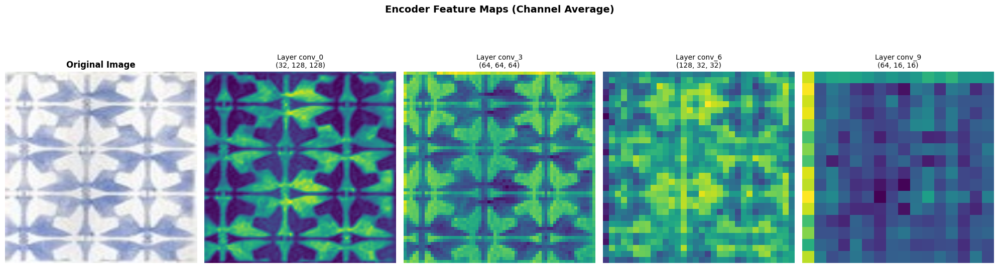

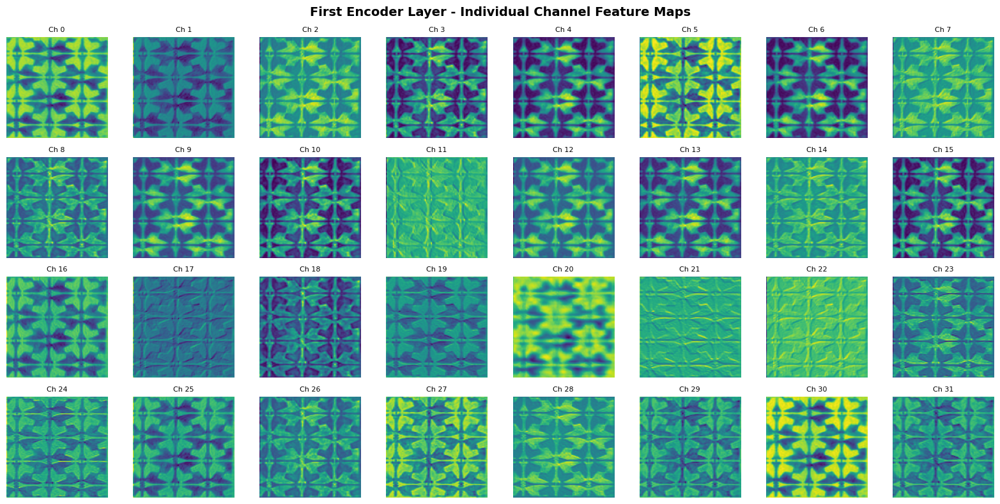

In [26]:
def visualize_feature_maps(model: nn.Module, loader: DataLoader, config: dict) -> None:
    """Visualize encoder feature maps at each layer."""
    model.eval()
    images, labels = next(iter(loader))
    sample_image = images[10:11].to(DEVICE)

    # Hook to capture intermediate activations
    activations = {}

    def get_activation(name):
        def hook(model, input, output):
            activations[name] = output.detach()
        return hook

    # Register hooks for each convolutional layer in encoder
    hooks = []
    for idx, layer in enumerate(model.encoder):
        if isinstance(layer, nn.Conv2d):
            hooks.append(layer.register_forward_hook(get_activation(f'conv_{idx}')))

    # Forward pass
    with torch.no_grad():
        _ = model.encoder(sample_image)

    # Remove hooks
    for hook in hooks:
        hook.remove()

    # Plot original image
    fig = plt.figure(figsize=(20, 12))

    # Show original image
    ax_orig = fig.add_subplot(2, 5, 1)
    orig_img = denormalize(sample_image, config["normalize_mean"], config["normalize_std"]).cpu()
    orig_np = orig_img[0].permute(1, 2, 0).numpy().clip(0, 1)
    if orig_np.shape[2] == 1:
        orig_np = orig_np.squeeze(-1)
        ax_orig.imshow(orig_np, cmap='gray')
    else:
        ax_orig.imshow(orig_np)
    ax_orig.set_title("Original Image", fontsize=12, fontweight='bold')
    ax_orig.axis('off')

    # Plot feature maps from each conv layer
    for i, (name, feat) in enumerate(activations.items()):
        feat_np = feat[0].cpu().numpy()

        # Show first 16 channels or all if less
        n_channels = min(16, feat_np.shape[0])

        # Create a grid of feature maps
        ax = fig.add_subplot(2, 5, i + 2)

        # Average across channels for visualization
        avg_feat = np.mean(feat_np, axis=0)
        im = ax.imshow(avg_feat, cmap='viridis')
        ax.set_title(f"Layer {name}\n{feat_np.shape}", fontsize=10)
        ax.axis('off')

    plt.suptitle("Encoder Feature Maps (Channel Average)", fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.savefig(CONFIG["output_dir"] / "feature_maps.png", dpi=150, bbox_inches='tight')
    plt.show()

    # Detailed view of first conv layer channels
    if 'conv_0' in activations:
        feat = activations['conv_0'][0].cpu().numpy()
        n_show = min(32, feat.shape[0])

        fig, axes = plt.subplots(4, 8, figsize=(16, 8))
        for i in range(n_show):
            ax = axes[i // 8, i % 8]
            ax.imshow(feat[i], cmap='viridis')
            ax.axis('off')
            ax.set_title(f'Ch {i}', fontsize=8)

        plt.suptitle("First Encoder Layer - Individual Channel Feature Maps", fontsize=14, fontweight='bold')
        plt.tight_layout()
        plt.savefig(CONFIG["output_dir"] / "feature_maps_detailed.png", dpi=150, bbox_inches='tight')
        plt.show()


# Visualize feature maps
visualize_feature_maps(model, test_loader, CONFIG)


## Latent Space Statistics


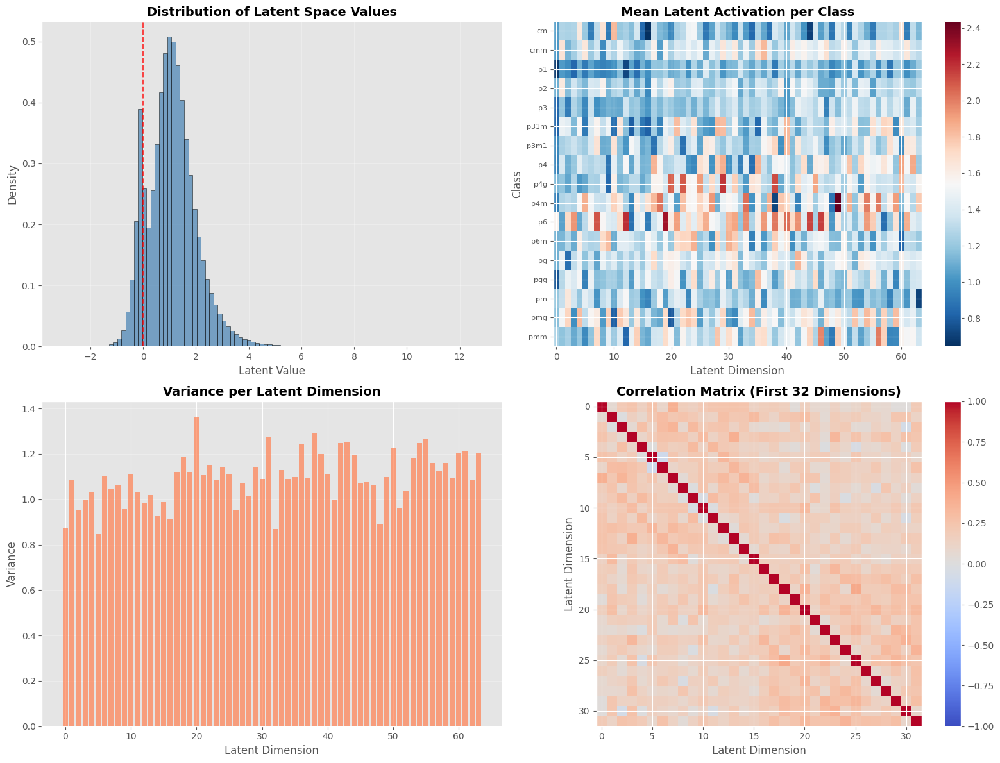


LATENT SPACE STATISTICS
Latent vector dimension: 16384
Mean latent value: 1.078246
Std latent value: 0.920277
Min latent value: -3.047380
Max latent value: 12.810332
Sparsity (% zeros): 0.84%


In [22]:
def plot_latent_statistics(latent_vectors: np.ndarray, labels: np.ndarray, class_names: list) -> None:
    """Analyze and visualize latent space statistics."""
    fig, axes = plt.subplots(2, 2, figsize=(16, 12))

    # Plot 1: Distribution of latent values
    ax1 = axes[0, 0]
    ax1.hist(latent_vectors.flatten(), bins=100, color='steelblue', alpha=0.7, edgecolor='black', density=True)
    ax1.set_xlabel("Latent Value", fontsize=12)
    ax1.set_ylabel("Density", fontsize=12)
    ax1.set_title("Distribution of Latent Space Values", fontsize=14, fontweight='bold')
    ax1.axvline(0, color='red', linestyle='--', alpha=0.7)
    ax1.grid(True, alpha=0.3)

    # Plot 2: Latent dimension activation heatmap
    ax2 = axes[0, 1]
    # Calculate mean activation per dimension per class
    unique_labels = np.unique(labels)
    class_means = np.zeros((len(unique_labels), min(64, latent_vectors.shape[1])))
    for i, label in enumerate(unique_labels):
        mask = labels == label
        class_means[i] = np.mean(latent_vectors[mask, :64], axis=0)

    im = ax2.imshow(class_means, aspect='auto', cmap='RdBu_r')
    ax2.set_xlabel("Latent Dimension", fontsize=12)
    ax2.set_ylabel("Class", fontsize=12)
    ax2.set_yticks(range(len(unique_labels)))
    ax2.set_yticklabels([class_names[l] for l in unique_labels], fontsize=8)
    ax2.set_title("Mean Latent Activation per Class", fontsize=14, fontweight='bold')
    plt.colorbar(im, ax=ax2)

    # Plot 3: Latent dimension variance
    ax3 = axes[1, 0]
    dim_variance = np.var(latent_vectors, axis=0)
    ax3.bar(range(min(64, len(dim_variance))), dim_variance[:64], color='coral', alpha=0.7)
    ax3.set_xlabel("Latent Dimension", fontsize=12)
    ax3.set_ylabel("Variance", fontsize=12)
    ax3.set_title("Variance per Latent Dimension", fontsize=14, fontweight='bold')
    ax3.grid(True, alpha=0.3, axis='y')

    # Plot 4: Correlation matrix of top latent dimensions
    ax4 = axes[1, 1]
    corr_matrix = np.corrcoef(latent_vectors[:, :32].T)
    im4 = ax4.imshow(corr_matrix, cmap='coolwarm', vmin=-1, vmax=1)
    ax4.set_xlabel("Latent Dimension", fontsize=12)
    ax4.set_ylabel("Latent Dimension", fontsize=12)
    ax4.set_title("Correlation Matrix (First 32 Dimensions)", fontsize=14, fontweight='bold')
    plt.colorbar(im4, ax=ax4)

    plt.tight_layout()
    plt.savefig(CONFIG["output_dir"] / "latent_statistics.png", dpi=150, bbox_inches='tight')
    plt.show()

    # Print statistics
    print("\n" + "="*60)
    print("LATENT SPACE STATISTICS")
    print("="*60)
    print(f"Latent vector dimension: {latent_vectors.shape[1]}")
    print(f"Mean latent value: {np.mean(latent_vectors):.6f}")
    print(f"Std latent value: {np.std(latent_vectors):.6f}")
    print(f"Min latent value: {np.min(latent_vectors):.6f}")
    print(f"Max latent value: {np.max(latent_vectors):.6f}")
    print(f"Sparsity (% zeros): {100 * np.mean(np.abs(latent_vectors) < 0.01):.2f}%")
    print("="*60)


# Analyze latent space statistics
plot_latent_statistics(latent_test, labels_test, metadata["class_names"])


## Per-Class Reconstruction Comparison


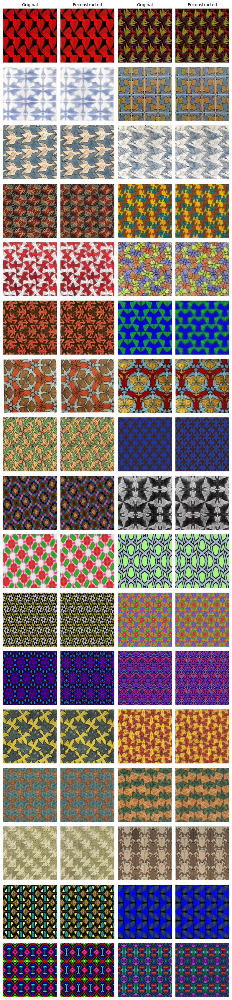

In [27]:
def visualize_per_class_reconstructions(model: nn.Module, loader: DataLoader,
                                         config: dict, class_names: list, samples_per_class: int = 2) -> None:
    """Show reconstruction examples for each class."""
    model.eval()

    # Collect samples per class
    class_samples = defaultdict(list)

    with torch.no_grad():
        for images, labels in loader:
            for i, label in enumerate(labels.tolist()):
                if len(class_samples[label]) < samples_per_class:
                    class_samples[label].append(images[i])

            # Check if we have enough samples
            if all(len(v) >= samples_per_class for v in class_samples.values()):
                if len(class_samples) >= len(class_names):
                    break

    n_classes = len(class_samples)
    fig, axes = plt.subplots(n_classes, samples_per_class * 2, figsize=(4 * samples_per_class, 2 * n_classes))

    for row, class_idx in enumerate(sorted(class_samples.keys())):
        samples = class_samples[class_idx]
        class_name = class_names[class_idx] if class_idx < len(class_names) else f"Class {class_idx}"

        for col, sample in enumerate(samples):
            sample_tensor = sample.unsqueeze(0).to(DEVICE)

            with torch.no_grad():
                recon = model(sample_tensor)

            # Denormalize
            orig = denormalize(sample_tensor, config["normalize_mean"], config["normalize_std"]).cpu()
            recon = denormalize(recon, config["normalize_mean"], config["normalize_std"]).cpu()

            orig_np = orig[0].permute(1, 2, 0).numpy().clip(0, 1)
            recon_np = recon[0].permute(1, 2, 0).numpy().clip(0, 1)

            if orig_np.shape[2] == 1:
                orig_np = orig_np.squeeze(-1)
                recon_np = recon_np.squeeze(-1)
                cmap = 'gray'
            else:
                cmap = None

            # Original
            ax_orig = axes[row, col * 2]
            ax_orig.imshow(orig_np, cmap=cmap)
            ax_orig.axis('off')
            if col == 0:
                ax_orig.set_ylabel(class_name, fontsize=10, fontweight='bold')
            if row == 0:
                ax_orig.set_title("Original", fontsize=10)

            # Reconstruction
            ax_recon = axes[row, col * 2 + 1]
            ax_recon.imshow(recon_np, cmap=cmap)
            ax_recon.axis('off')
            if row == 0:
                ax_recon.set_title("Reconstructed", fontsize=10)


    plt.tight_layout()
    plt.savefig(CONFIG["output_dir"] / "per_class_reconstructions.png", dpi=150, bbox_inches='tight')
    plt.show()


# Visualize per-class reconstructions
visualize_per_class_reconstructions(model, test_loader, CONFIG, metadata["class_names"], samples_per_class=2)


## Comprehensive Results Summary


In [24]:
def generate_comprehensive_summary(model: nn.Module, config: dict, metadata: dict,
                                   history: dict, test_loss: float, class_summary: list) -> None:
    """Generate a comprehensive summary of all results."""

    print("\n" + "="*80)
    print("                    AUTOENCODER EXPERIMENT - COMPREHENSIVE SUMMARY")
    print("="*80)

    # Model Information
    print("\n[1] MODEL ARCHITECTURE")
    print("-"*40)
    print(f"    Model Type: Convolutional Autoencoder")
    print(f"    Input Size: {config['image_size'][0]}x{config['image_size'][1]}x{config['num_channels']}")
    print(f"    Base Channels: {config['base_channels']}")
    print(f"    Latent Channels: {config['latent_channels']}")
    print(f"    Total Parameters: {count_parameters(model):,}")

    # Dataset Information
    print("\n[2] DATASET INFORMATION")
    print("-"*40)
    print(f"    Training Samples: {metadata['train_size']:,}")
    print(f"    Validation Samples: {metadata['val_size']:,}")
    print(f"    Test Samples: {metadata['test_size']:,}")
    print(f"    Number of Classes: {len(metadata['class_names'])}")
    print(f"    Classes: {', '.join(metadata['class_names'])}")

    # Training Configuration
    print("\n[3] TRAINING CONFIGURATION")
    print("-"*40)
    print(f"    Epochs: {config['epochs']}")
    print(f"    Batch Size: {config['batch_size']}")
    print(f"    Learning Rate: {config['learning_rate']}")
    print(f"    Weight Decay: {config['weight_decay']}")
    print(f"    Patience (Early Stopping): {config['patience']}")
    print(f"    Optimizer: AdamW")
    print(f"    Scheduler: CosineAnnealingLR")
    print(f"    Loss Function: MSE")

    # Training Results
    print("\n[4] TRAINING RESULTS")
    print("-"*40)
    print(f"    Total Epochs Trained: {len(history['train'])}")
    print(f"    Final Training Loss: {history['train'][-1]:.6f}")
    if any(v is not None for v in history.get('val', [])):
        best_val = min([v for v in history['val'] if v is not None])
        final_val = history['val'][-1]
        print(f"    Final Validation Loss: {final_val:.6f}")
        print(f"    Best Validation Loss: {best_val:.6f}")

    # Test Results
    print("\n[5] TEST RESULTS")
    print("-"*40)
    print(f"    Test MSE Loss: {test_loss:.6f}")
    print(f"    Test RMSE: {np.sqrt(test_loss):.6f}")

    # Per-class performance
    print("\n[6] PER-CLASS PERFORMANCE (Top 5 Best & Worst)")
    print("-"*40)
    print("    Best Reconstructed Classes:")
    for name, mean_err, std_err in class_summary[:5]:
        print(f"      - {name}: {mean_err:.6f} ± {std_err:.6f}")
    print("\n    Worst Reconstructed Classes:")
    for name, mean_err, std_err in class_summary[-5:]:
        print(f"      - {name}: {mean_err:.6f} ± {std_err:.6f}")

    # Saved Files
    print("\n[7] SAVED ARTIFACTS")
    print("-"*40)
    print(f"    Output Directory: {config['output_dir']}")
    saved_files = list(config['output_dir'].glob("*.png")) + list(config['output_dir'].glob("*.pt"))
    for f in saved_files:
        print(f"      - {f.name}")

    print("\n" + "="*80)
    print("                              END OF SUMMARY")
    print("="*80)


# Generate comprehensive summary
generate_comprehensive_summary(model, CONFIG, metadata, history, test_loss, class_summary)



                    AUTOENCODER EXPERIMENT - COMPREHENSIVE SUMMARY

[1] MODEL ARCHITECTURE
----------------------------------------
    Model Type: Convolutional Autoencoder
    Input Size: 256x256x3
    Base Channels: 32
    Latent Channels: 64
    Total Parameters: 464,739

[2] DATASET INFORMATION
----------------------------------------
    Training Samples: 76,500
    Validation Samples: 8,500
    Test Samples: 355
    Number of Classes: 17
    Classes: cm, cmm, p1, p2, p3, p31m, p3m1, p4, p4g, p4m, p6, p6m, pg, pgg, pm, pmg, pmm

[3] TRAINING CONFIGURATION
----------------------------------------
    Epochs: 30
    Batch Size: 32
    Learning Rate: 0.001
    Weight Decay: 1e-05
    Patience (Early Stopping): 5
    Optimizer: AdamW
    Scheduler: CosineAnnealingLR
    Loss Function: MSE

[4] TRAINING RESULTS
----------------------------------------
    Total Epochs Trained: 21
    Final Training Loss: 0.009903
    Final Validation Loss: 0.009579
    Best Validation Loss: 0.009285


In [31]:
!zip -r deneme.zip /content/artifacts

updating: content/artifacts/ (stored 0%)
  adding: content/artifacts/feature_maps.png (deflated 4%)
  adding: content/artifacts/latent_statistics.png (deflated 18%)
  adding: content/artifacts/error_distribution.png (deflated 15%)
  adding: content/artifacts/tsne_latent_space.png (deflated 11%)
  adding: content/artifacts/training_history.png (deflated 8%)
  adding: content/artifacts/reconstruction_comparison.png (deflated 0%)
  adding: content/artifacts/pca_latent_space.png (deflated 8%)
  adding: content/artifacts/per_class_reconstructions.png (deflated 0%)
  adding: content/artifacts/best_autoencoder.pt (deflated 7%)
  adding: content/artifacts/feature_maps_detailed.png (deflated 0%)


## Notes and Next Steps

### Key Findings
- The autoencoder has been trained to reconstruct symmetry patterns from the dataset
- Training history shows convergence with early stopping capability
- Latent space analysis (t-SNE & PCA) reveals class clustering behavior
- Per-class reconstruction errors indicate which patterns are easier/harder to reconstruct

### Potential Improvements
- Increase latent channel count for better reconstruction quality
- Experiment with different architectures (deeper networks, skip connections)
- Try different normalization strategies
- Add noise for denoising autoencoder experiments
- Implement variational autoencoder (VAE) for generative capabilities

### Saved Artifacts
All visualizations and model checkpoints are saved in the `artifacts` directory:
- `best_autoencoder.pt` - Best model checkpoint
- `training_history.png` - Loss curves
- `reconstruction_comparison.png` - Original vs reconstruction comparison
- `tsne_latent_space.png` - t-SNE visualization
- `pca_latent_space.png` - PCA visualization and explained variance
- `error_distribution.png` - Error distribution analysis
- `feature_maps.png` - Encoder feature maps
- `latent_statistics.png` - Latent space statistics
- `per_class_reconstructions.png` - Per-class reconstruction examples
